In [1]:
# Imports
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns

from pathlib import Path,PurePosixPath
import matplotlib.pyplot as plt
from matplotlib import rcParams


In [3]:
# Configs
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,figsize=(12,8),facecolor='white')

experiment_results_dir_path=PurePosixPath('/home/labs/amit/weiner/Serono/Serono14/clustering_results/simple_clustering_2021_09_05__15_04_43')
sc.settings.figdir=Path('/home/labs/amit/weiner/Serono/Serono14/clustering_results/simple_clustering_2021_09_05__15_04_43/figures')

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.4


In [51]:
adata = ad.read_h5ad(Path(experiment_results_dir_path, "metacells.h5ad"))
print(adata.shape)


(2926, 23465)


In [52]:
## plot log10 # counts per cell
sc.pp.filter_cells(adata, min_genes=200) # filter cells with fewer than 200 genes
sc.pp.filter_cells(adata, min_counts=200)  # This is a weaker threshold than above. It is just to population the n_counts column in adata
sc.pp.filter_genes(adata, min_cells=2) # filter genes detected in fewer than 3 cells


filtered out 956 genes that are detected in less than 2 cells


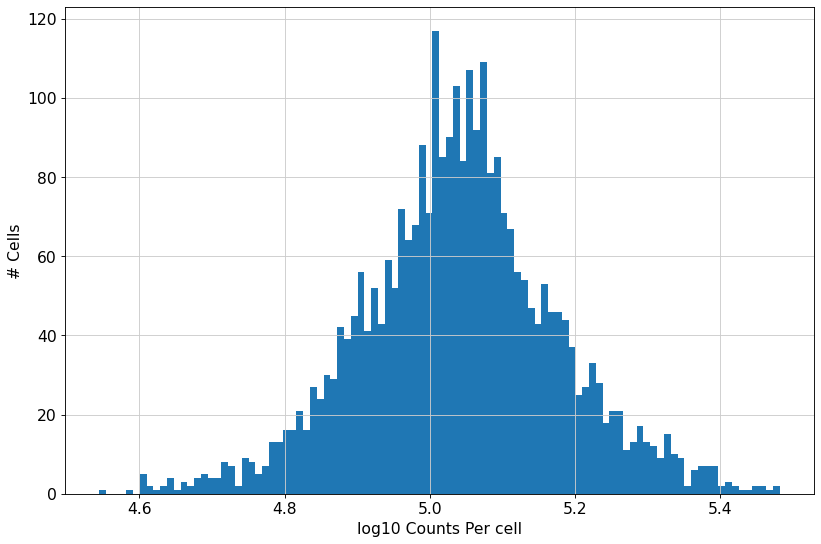

In [53]:
## plot log10 # counts per cell
plt.hist(np.log10(adata.obs['n_counts']), bins=100)
_ = plt.xlabel('log10 Counts Per cell')
_ = plt.ylabel('# Cells')
plt.show()

In [54]:
sc.pp.normalize_total(adata, target_sum=1e6)

normalizing counts per cell
    finished (0:00:00)


In [55]:
sc.pp.log1p(adata)

In [56]:
np.sum(adata.var.top_feature_gene)
sc.pp.highly_variable_genes(adata, min_mean=0.1, max_mean=3, min_disp=0.8)
#sc.pp.highly_variable_genes(adata, flavor="seurat_v3",n_top_genes=2000)
#adata.var['highly_variable'] = adata.var.feature_gene>2

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [57]:
sum(adata.var['highly_variable'])


1838

In [58]:
adata.var['highly_variable']=np.logical_or(adata.var['highly_variable'],adata.var.feature_gene>3)

In [59]:
adata.var['highly_variable']
np.sum(adata.var.highly_variable)

5623

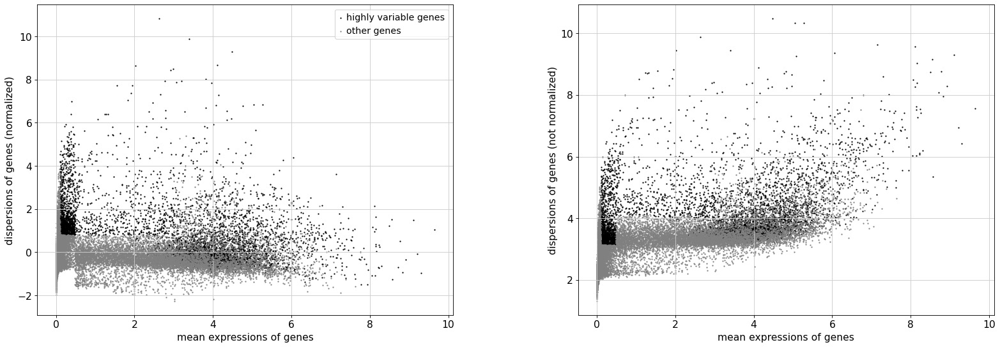

In [60]:
sc.pl.highly_variable_genes(adata)

In [61]:
adata.raw = adata

In [62]:
adata = adata[:, adata.var.highly_variable]

In [63]:
#sc.pp.scale(adata, max_value=10)
sc.pp.scale(adata)

Revieved a view of an AnnData. Making a copy.


In [64]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:00)


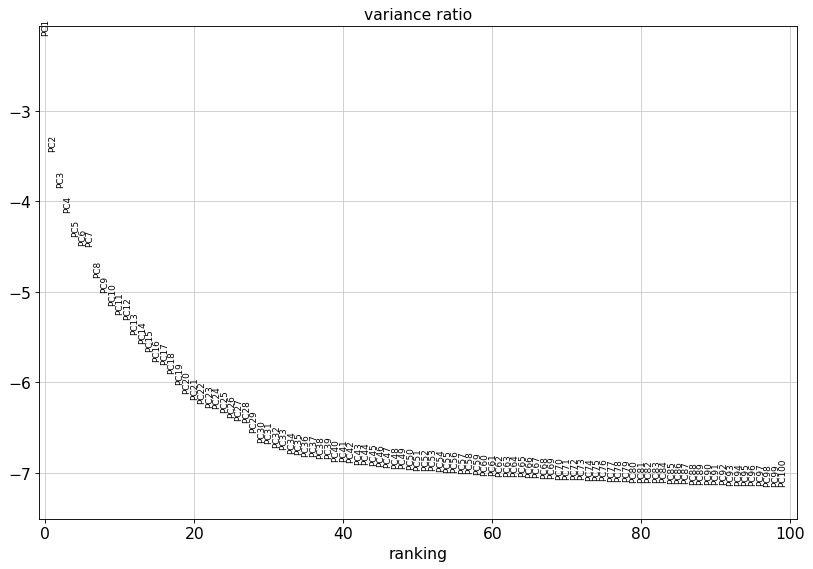

In [65]:
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=100)


In [66]:
adata.write(Path(experiment_results_dir_path, "metacells_scanpy.h5ad"))

In [67]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=60)

computing neighbors
    using 'X_pca' with n_pcs = 60
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [176]:
sc.tl.umap(adata,min_dist=0.5,spread=0.7)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


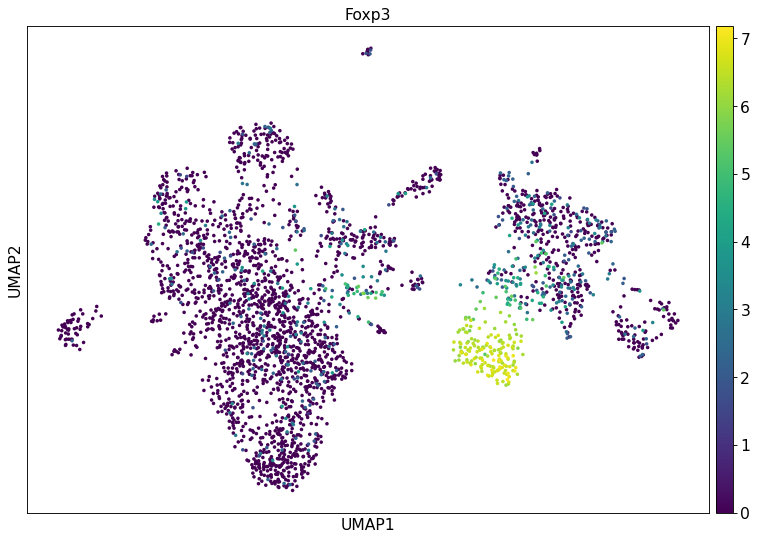

In [94]:
sc.pl.umap(adata,color=["Foxp3"])

In [177]:
sc.tl.tsne(adata,n_pcs=60)

computing tSNE
    using 'X_pca' with n_pcs = 60
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:05)


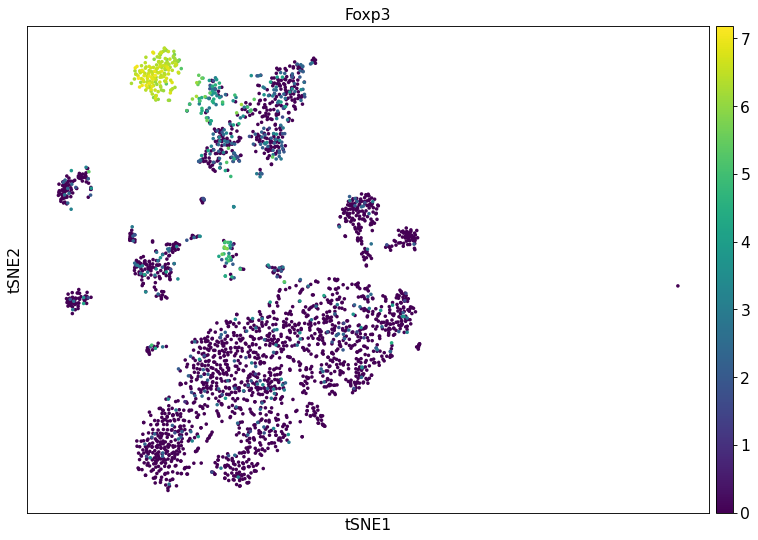

In [178]:
sc.pl.tsne(adata,color=["Foxp3"])

In [108]:
sc.tl.leiden(adata,resolution=4.5)

running Leiden clustering
    finished: found 53 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


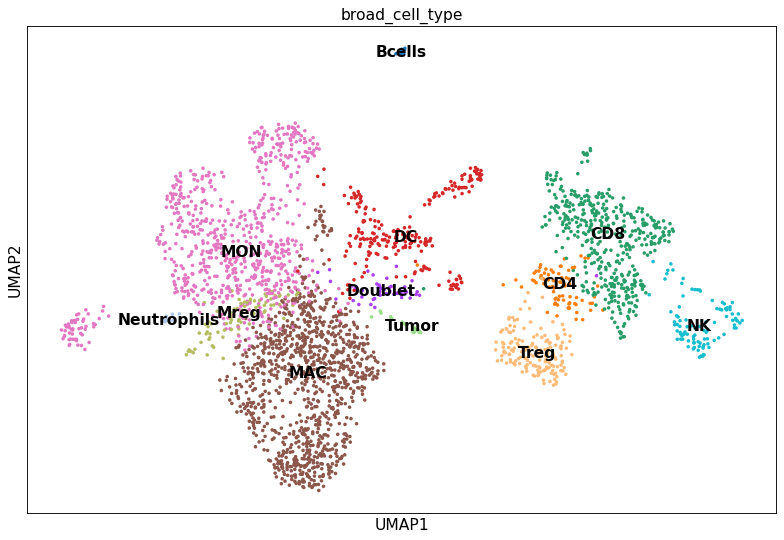

In [482]:
sc.pl.umap(adata,color=['broad_cell_type'],legend_loc='on data')

In [479]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap = ListedColormap(adata.uns['leiden_colors'])

# Nicer plot
fig, ax = plt.subplots()

scatter = ax.scatter(adata.obsm['X_umap'][:,0], 
                     adata.obsm['X_umap'][:,1], 
                     #c=adata.obs['leiden'].astype('int'), 
                     c=adata.obs['cell_type'],
                     s=adata.obs['grouped'],
                     edgecolors='black',
                     linewidths=0.5,
                     alpha=0.7,cmap=cmap)

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),bbox_to_anchor=(1.14,1),
                    loc="upper right", title="Clusters")
ax.add_artist(legend1)

# produce a legend with a cross section of sizes from the scatter
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
legend2 = ax.legend(handles, labels, loc="lower right", title="Cells",bbox_to_anchor=(1.14,0))

plt.show()

#plt.scatter(adata.obsm['X_umap'][:,0],adata.obsm['X_umap'][:,1],
#            c = adata.obs['leiden'].astype('int')+1, s=(adata.obs['grouped']), edgecolors='black',
#            linewidths=0.5,alpha=0.7,cmap=cmap)
#plt.show()

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not 0       T-M doublet
1       T-M doublet
2       T-M doublet
3         CD8_Pdcd1
4          pDC_Ccr9
           ...     
2921           Treg
2922        NK_Spp1
2923           Treg
2924        NK_Spp1
2925        NK_Spp1
Name: cell_type, Length: 2926, dtype: category
Categories (27, object): ['Bcells', 'CD4_Cd40lg', 'CD8_Cd160', 'CD8_Pdcd1', ..., 'cDC1_Xcr1', 'cDC2_Cd209a', 'migDC', 'pDC_Ccr9']

In [353]:
# Split cluster 40
to_split = [11,1540, 1543,1545,1555,1562,1564,1571,2820]
adata.obs['leiden']=adata.obs['leiden'].cat.add_categories('53')
adata.obs['leiden'][to_split] = '53'

In [360]:
adata.obs['leiden'][to_split]

11      53
1540    53
1543    53
1545    53
1555    53
1562    53
1564    53
1571    53
2820    53
Name: leiden, dtype: category
Categories (54, object): ['0', '1', '2', '3', ..., '50', '51', '52', '53']

In [384]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


In [112]:
adata.uns['rank_genes_groups']['scores']['0']

array([ 58.6855  ,  57.533104,  54.04789 , ..., -23.66892 , -24.03287 ,
       -36.120415], dtype=float32)

    using 'X_pca' with n_pcs = 60
Storing dendrogram info using `.uns['dendrogram_leiden']`


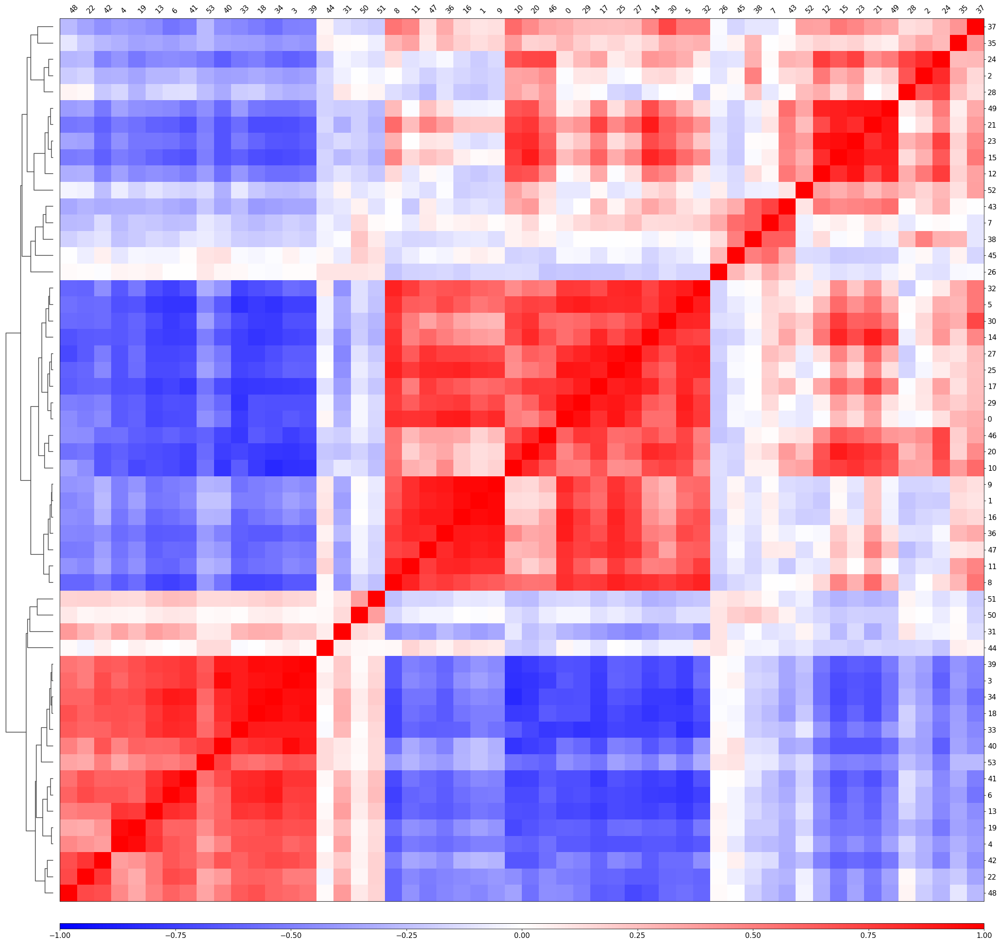

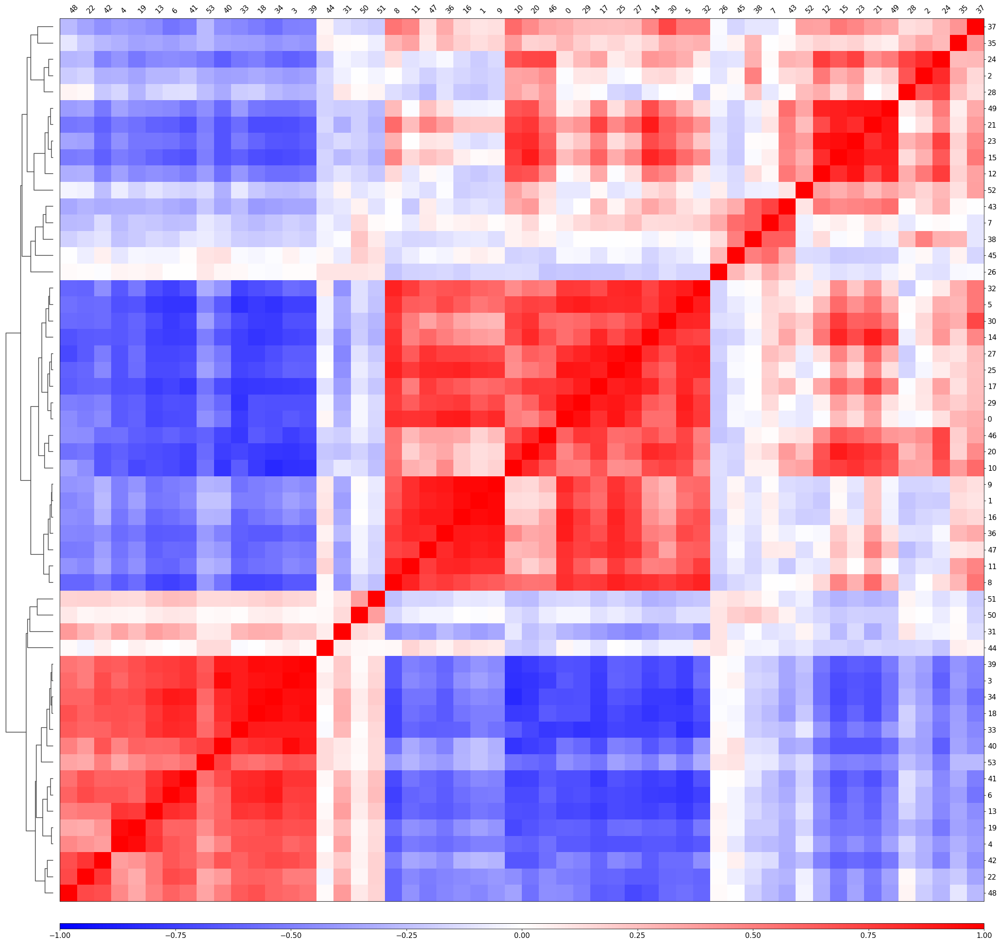

In [385]:
# correlation plot
sc.tl.dendrogram(adata, 'leiden', n_pcs=60)
ax = sc.pl.correlation_matrix(adata, 'leiden')
sc.pl.correlation_matrix(adata, 'leiden',save="correlation_matrix")

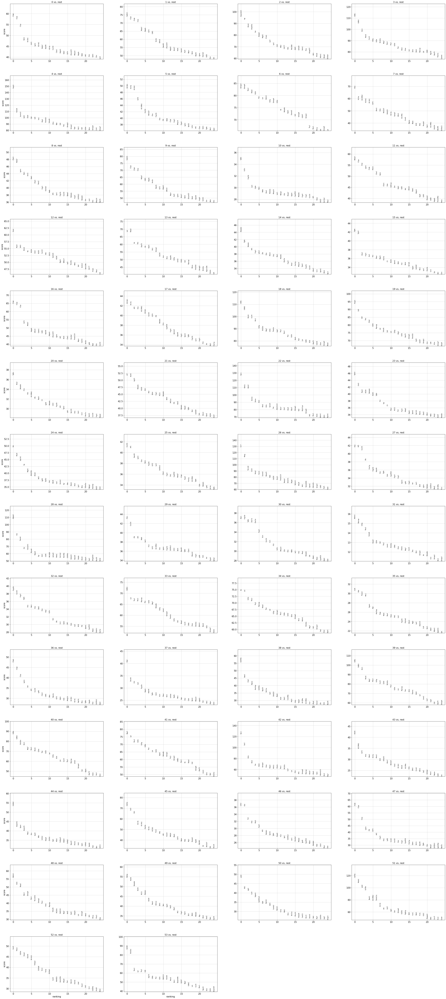

In [386]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,save="rank_genes_groups.pdf")

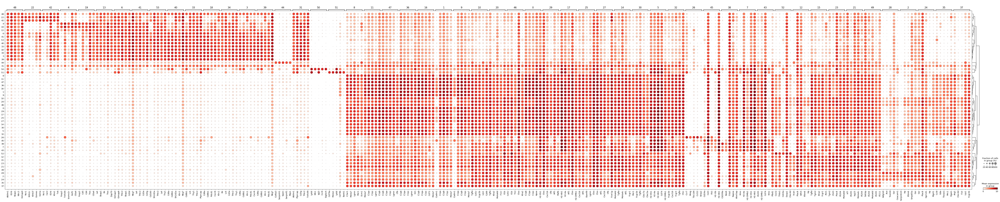

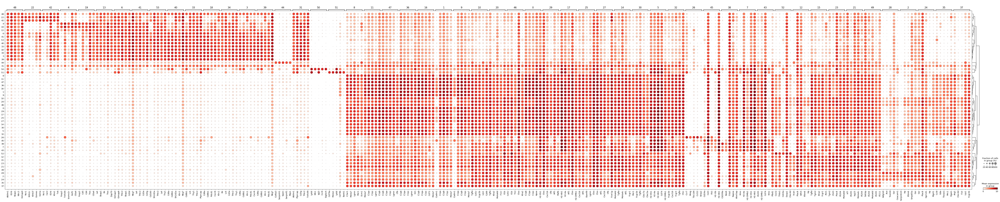

In [387]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5,save="rank_genes_groups_dotplot.pdf")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5)

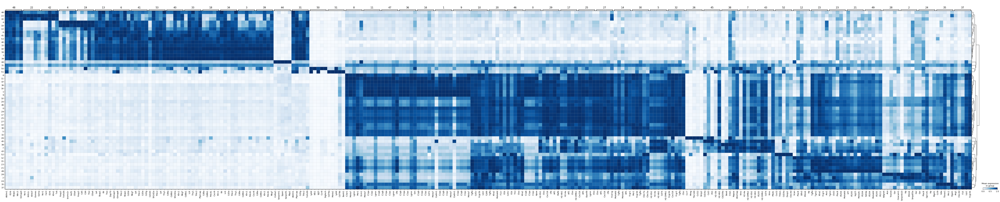

In [388]:
axs = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, standard_scale='var', cmap='Blues')

In [365]:
# Now split to T-cells and M-cells and calc gene score
T_cells_clusters = ['48','22','42','40','33','3','39','18','34','4','19','13','6','41','53']

Tumor_cells_clusters = ['44','40']
DC = ['50','26','45','38']
Doublet = ['31']
B_cells_clusters = ['51']

M_cells_clusters = ['8','11','47','36','16','1','9','10','20','46','0','29','17','25',
                   '27','14','30','5','32','26','45','38','7','43','52','12','15','23',
                   '21','49','28','2','24','35','37']


In [366]:
adata_T = adata
adata_T = adata_T[adata_T.obs['leiden'].isin(T_cells_clusters)]
sc.tl.rank_genes_groups(adata_T, groupby='leiden', method='t-test')

rank_genes= sc.get.rank_genes_groups_df(adata_T,group=None)
rank_genes_pv_scores = pd.pivot(rank_genes,index='names', columns='group', values='scores')
rank_genes_pv_logfoldchanges = pd.pivot(rank_genes,index='names', columns='group', values='logfoldchanges')
rank_genes_pv_pvals_adj = -np.log10(pd.pivot(rank_genes,index='names', columns='group', values='pvals_adj'))

result = pd.merge(rank_genes_pv_scores, rank_genes_pv_logfoldchanges, on="names",suffixes=("_score","_log_fc"))
result = pd.merge(result, rank_genes_pv_pvals_adj, on="names")
result.to_csv(Path(experiment_results_dir_path, "T_cells_table.csv"))

ranking genes
Trying to set attribute `.uns` of view, copying.
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


In [367]:
result

group,3_score,4_score,6_score,13_score,18_score,19_score,22_score,33_score,34_score,39_score,...,19,22,33,34,39,40,41,42,48,53
names,,,,,,,,,,,,,,,,,,,,,
1700047I17Rik2,-0.289542,2.618078,0.539097,-0.654772,-0.544210,2.543227,-1.839919,-1.647165,-2.790385,-0.599101,...,1.275127,0.752395,0.610681,1.254385,0.141447,0.174971,0.332283,0.125363,0.509621,0.389515
2610044O15Rik8,1.493569,-1.550289,-0.854224,-0.343226,1.353130,0.698581,-1.730850,-1.311551,1.392101,1.714126,...,0.184528,0.694091,0.447335,0.414324,0.621819,3.052967,0.435714,1.277506,0.223742,1.242786
2810047C21Rik1,1.042139,-0.407918,0.227184,-3.115662,0.099058,0.736571,0.097818,0.457585,-3.114644,-3.114344,...,0.198578,0.009243,0.112102,1.705221,1.866780,2.089792,1.809588,1.987613,1.938047,2.050725
9930111J21Rik1,-1.780452,-0.089544,4.438317,0.770881,0.965774,-0.161730,-3.545733,-0.553042,0.604912,1.919910,...,0.021674,2.388192,0.143467,0.128817,0.727632,0.758988,0.100815,0.809069,-0.000000,1.313656
9930111J21Rik2,-6.294538,1.569373,8.061564,2.866312,6.253120,-7.849078,-0.916390,5.595291,2.469762,-3.411391,...,9.820330,0.283646,4.643355,1.032839,1.860808,4.747160,0.640431,2.523650,0.331433,2.020931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n-R5s96,-1.730293,0.711491,-1.730227,-1.730164,-1.730125,-1.730118,-1.730101,-1.730054,0.872251,-1.729997,...,0.677479,0.697007,0.667829,0.211718,0.654883,0.774749,0.614406,0.299862,0.701391,0.771155
n-R5s97,-2.237740,0.390177,0.458328,-2.237406,-2.237304,-2.237286,-2.237242,0.763424,-2.237069,0.824199,...,1.044983,1.077585,0.220328,0.897325,0.220687,1.159660,0.953263,1.087765,0.287961,1.148937
n-R5s98,-1.413479,-1.413463,-1.413452,-1.413427,-1.413411,-1.413408,0.904378,-1.413382,-1.413374,-1.413358,...,0.495725,0.278634,0.502841,0.424424,0.478771,0.576936,0.260369,0.532841,0.520984,0.573889


In [368]:
adata_M = adata
adata_M = adata_M[adata_M.obs['leiden'].isin(M_cells_clusters)]
sc.tl.rank_genes_groups(adata_M, groupby='leiden', method='t-test')

ranking genes
Trying to set attribute `.uns` of view, copying.
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [369]:
rank_genes= sc.get.rank_genes_groups_df(adata_M,group=None)
rank_genes_pv_scores = pd.pivot(rank_genes,index='names', columns='group', values='scores')
rank_genes_pv_logfoldchanges = pd.pivot(rank_genes,index='names', columns='group', values='logfoldchanges')
rank_genes_pv_pvals_adj = -np.log10(pd.pivot(rank_genes,index='names', columns='group', values='pvals_adj'))

result = pd.merge(rank_genes_pv_scores, rank_genes_pv_logfoldchanges, on="names",suffixes=("_score","_log_fc"))
result = pd.merge(result, rank_genes_pv_pvals_adj, on="names")
result.to_csv(Path(experiment_results_dir_path, "M_cells_table.csv"))


In [370]:
T_cells_clusters

['48',
 '22',
 '42',
 '40',
 '33',
 '3',
 '39',
 '18',
 '34',
 '4',
 '19',
 '13',
 '6',
 '41',
 '53']

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:00)
    using 'X_pca' with n_pcs = 40
Storing dendrogram info using `.uns['dendrogram_leiden']`


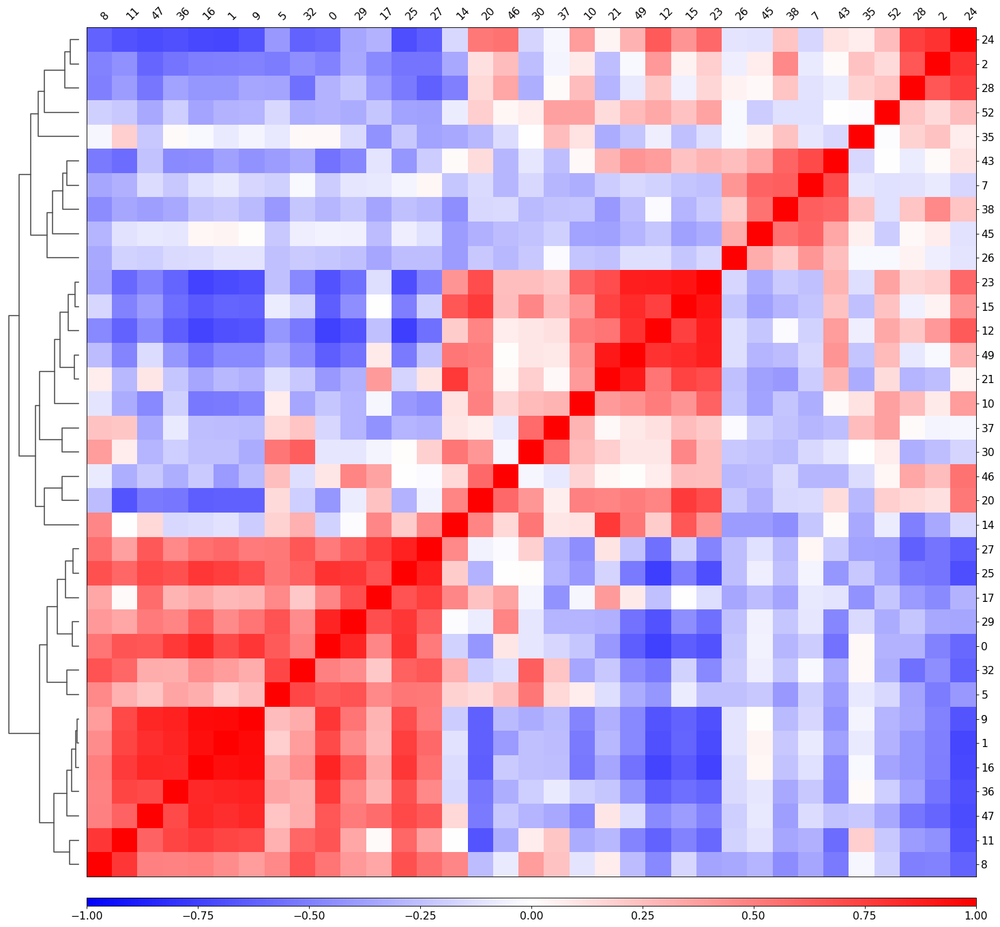

In [371]:
# correlation plot
sc.tl.pca(adata_M, svd_solver='arpack',n_comps=100)
sc.tl.dendrogram(adata_M, 'leiden', n_pcs=40)
sc.pl.correlation_matrix(adata_M, 'leiden',save="M")

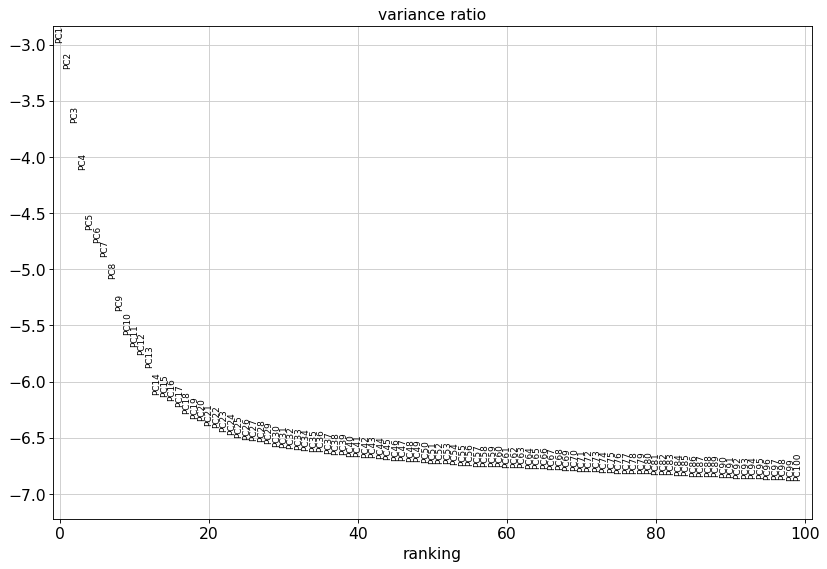

In [376]:
sc.pl.pca_variance_ratio(adata_M, log=True,n_pcs=100)


In [377]:
sc.pp.neighbors(adata_M, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_M,min_dist=0.3,spread=0.5)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


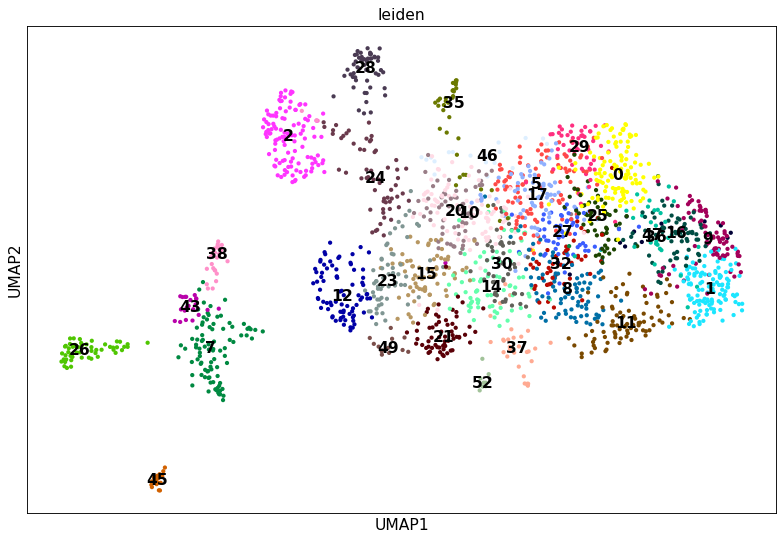

In [378]:
sc.pl.umap(adata_M,color=['leiden'],legend_loc='on data',save="_M")

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:00)


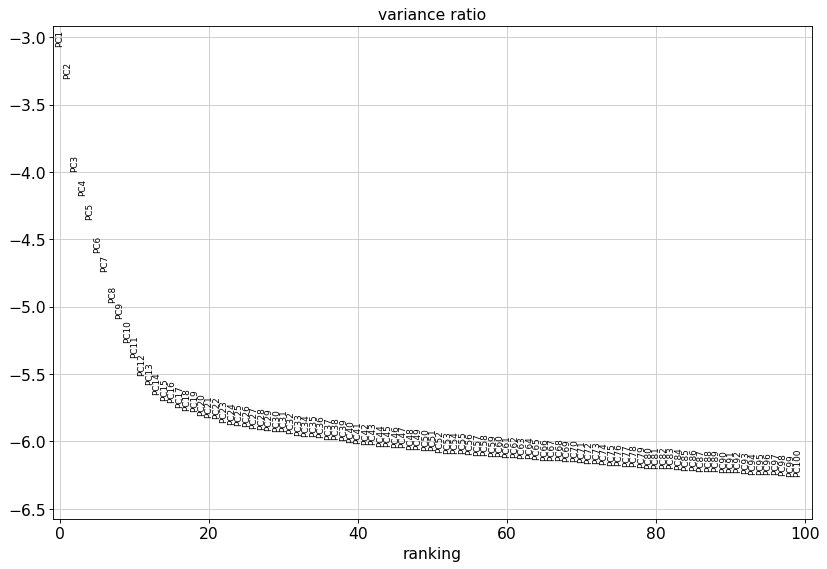

In [372]:
# Tcells
# correlation plot
sc.tl.pca(adata_T, svd_solver='arpack',n_comps=100)
sc.pl.pca_variance_ratio(adata_T, log=True,n_pcs=100)


    using 'X_pca' with n_pcs = 40
Storing dendrogram info using `.uns['dendrogram_leiden']`


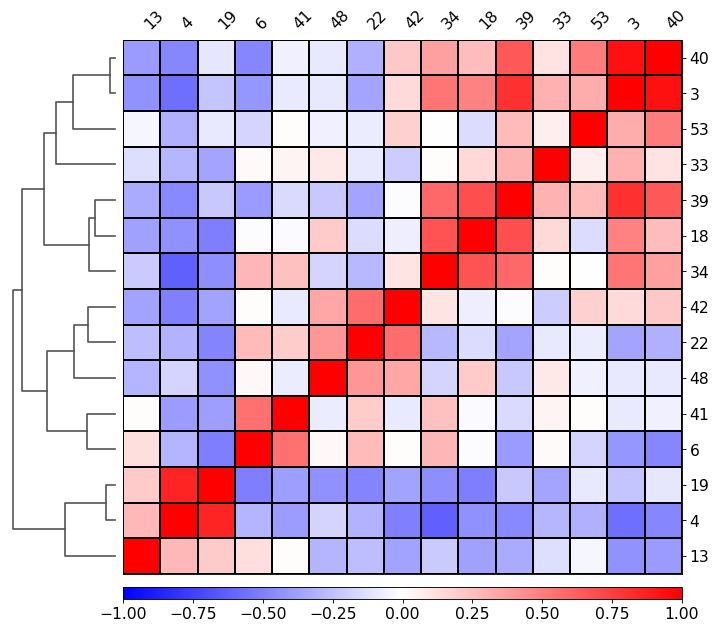

In [373]:
sc.tl.dendrogram(adata_T, 'leiden', n_pcs=40)
sc.pl.correlation_matrix(adata_T, 'leiden',save="T")

In [374]:
sc.pp.neighbors(adata_T, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_T,min_dist=0.3,spread=0.5)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


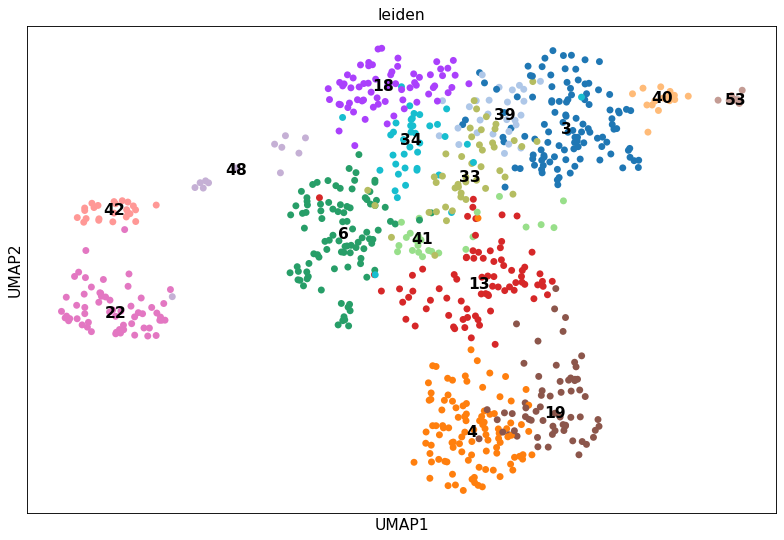

In [375]:
sc.pl.umap(adata_T,color=['leiden'],legend_loc='on data',save="_T")

In [477]:
# Save data
adata.write(Path(experiment_results_dir_path, "scanpy_metacells.h5ad"))
adata_M.write(Path(experiment_results_dir_path, "scanpy_metacells_M.h5ad"))
adata_T.write(Path(experiment_results_dir_path, "scanpy_metacells_T.h5ad"))

... storing 'clusters' as categorical
... storing 'cell_types' as categorical
... storing 'cell_type' as categorical
... storing 'broad_cell_type' as categorical


In [380]:
adata

AnnData object with n_obs × n_vars = 2926 × 5623
    obs: 'grouped', 'pile', 'candidate', 'umap_x', 'umap_y', 'n_genes', 'n_counts', 'leiden'
    var: 'excluded_gene', 'clean_gene', 'forbidden_gene', 'pre_feature_gene', 'feature_gene', 'top_feature_gene', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: '__name__', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'obs_balanced_ranks', 'obs_outgoing_weights', 'obs_pruned_ranks', 'distances', 'connectivities'

In [381]:
# Save data for MCViewer
adata_orig = ad.read_h5ad(Path(experiment_results_dir_path, "metacells.h5ad"))
adata_mc = adata_orig
adata_mc.obs.umap_x = adata.obsm['X_umap'][:,0]
adata_mc.obs.umap_y = adata.obsm['X_umap'][:,1]
adata_mc.obs['leiden'] = adata.obs.leiden


In [382]:
adata_mc.write(Path(experiment_results_dir_path, "scanpy_metacells_for_mcview.h5ad"))

In [229]:
df = pd.DataFrame(adata.X,columns=adata.var.index,index=[adata.obs.leiden,)

In [230]:
df.T.to_csv(Path(experiment_results_dir_path, "mc_norm.csv"))

In [457]:
annots[annots['Cluster']==51]['Lineage'][0]

'Bcells'

In [473]:
# Read annotation from csv file
annots = pd.read_csv(Path(experiment_results_dir_path, "MC_annotations.csv"))

adata.obs['cell_type'] = 'na'
adata.obs['broad_cell_type'] = 'na'
clusters = adata.obs['leiden'].to_numpy().astype(int)
unique_clusters=np.unique(clusters)
for i in unique_clusters:
    adata.obs['cell_type'][clusters==i] = annots[annots['Cluster']==i]['Annotation'].iloc[0]
    adata.obs['broad_cell_type'][clusters==i] = annots[annots['Cluster']==i]['Lineage'].iloc[0]


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

,grouped,pile,candidate,umap_x,umap_y,n_genes,n_counts,leiden,clusters,cell_types,cell_type,broad_cell_type
0,16,0,0,25.350109,-4.759020,6589,47697.0,31,na,na,T-M doublet,Doublet
1,29,1,1,-7.274315,12.689219,8606,97179.0,31,na,na,T-M doublet,Doublet
2,14,2,2,-23.144928,-1.377977,8512,38953.0,31,na,na,T-M doublet,Doublet
3,37,3,3,29.367409,11.950519,8270,100522.0,18,na,na,CD8_Pdcd1,CD8
4,38,4,4,-12.367815,13.995356,8612,94457.0,50,na,na,pDC_Ccr9,DC
...,...,...,...,...,...,...,...,...,...,...,...,...
2921,46,85,2936,36.655830,20.313461,8413,149816.0,19,na,na,Treg,Treg
2922,30,85,2937,26.356808,-5.567659,8171,98048.0,42,na,na,NK_Spp1,NK
2923,36,85,2938,37.195515,19.826414,8218,122570.0,19,na,na,Treg,Treg
2924,21,85,2939,27.864983,3.059853,7371,68393.0,42,na,na,NK_Spp1,NK


In [389]:
# Cluster - cluster volcano
sc.tl.rank_genes_groups(adata, groupby='leiden', groups=['18','33','34','39'],reference='18',method='wilcoxon')


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


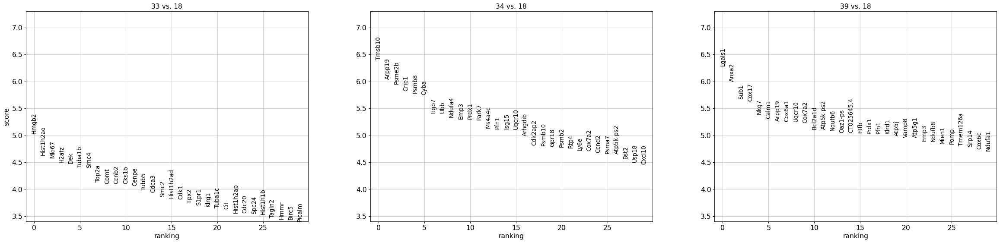

In [390]:
sc.pl.rank_genes_groups(adata,n_genes=30,fontsize=12)


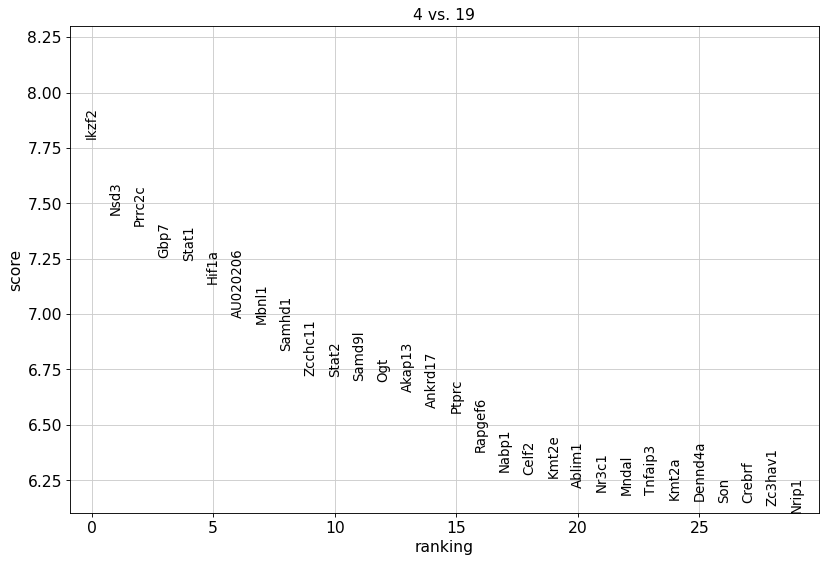

In [332]:
sc.pl.rank_genes_groups(adata,n_genes=30,fontsize=12)


In [333]:
res = pd.DataFrame(columns=adata.var_names, index=adata.obs['leiden'].cat.categories)                                                                                                 

for clust in adata.obs.leiden.cat.categories: 
    res.loc[clust] = adata[adata.obs['leiden'].isin([clust]),:].X.mean(0)

In [338]:
res

,2610044O15Rik8,A1cf,A3galt2,AA467197,AA543186,AA914427,AB124611,AF067061,AI182371,AI314180,...,Zyg11b,Zyx,Zzef1,Zzz3,n-R5s192,n-R5s197,n-R5s219,n-R5s29,n-R5s40,n-TStga1
0,-0.11339,-0.117613,-0.120934,0.305212,0.083495,-0.101725,0.311933,-0.065575,-0.135477,0.104268,...,-0.150622,-0.650329,-0.125407,0.055281,-0.130112,-0.150336,0.253284,0.003362,-0.15387,0.010559
1,-0.155075,-0.117613,-0.120934,-0.189045,0.220335,-0.013585,0.249733,-0.065575,-0.031751,-0.403878,...,-0.298041,-0.83456,-0.431092,-0.176086,-0.031536,0.009889,0.055549,0.142424,0.001178,-0.105955
2,-0.175553,-0.117613,0.003417,-1.988435,0.005402,-0.034447,0.821413,0.034191,0.01609,0.207018,...,-0.13526,1.164745,0.493723,0.149983,0.0917,0.00116,0.011603,-0.07298,0.045916,-0.105955
3,0.526674,-0.014606,0.019743,-0.117521,-0.13007,0.124236,-1.010411,-0.065575,0.105757,0.113975,...,0.542934,0.469698,-0.061957,0.403712,0.163492,-0.025748,-0.086562,-0.072995,0.045558,0.031306
4,0.233722,0.605801,-0.120934,-1.044613,0.088149,-0.075098,-2.12846,-0.065575,0.110221,0.060629,...,0.554357,-1.202288,0.356283,0.150274,-0.054276,0.074903,-0.076743,0.108238,-0.107184,0.110932
5,-0.143328,-0.117613,0.09072,0.716709,-0.17738,-0.141495,0.494821,-0.065575,0.005728,0.083312,...,0.074309,-0.243282,-0.208666,-0.064767,-0.006908,0.021952,0.007968,-0.010665,-0.065836,0.062239
6,0.295741,0.1201,0.106639,-1.427878,0.011582,0.008701,-0.166692,-0.065575,0.249196,0.35027,...,0.864896,0.374368,0.350251,0.359133,-0.057123,0.045462,-0.138965,-0.070022,0.17604,0.117513
7,0.007595,-0.031772,-0.047639,0.723683,0.365086,0.156559,-0.41773,0.058804,0.186809,-0.061141,...,-0.411499,0.586345,-0.138549,-0.179758,0.119658,-0.183263,-0.138965,-0.126232,-0.002841,-0.105955
8,-0.044149,-0.045652,-0.00365,0.788178,-0.17738,0.014824,0.452248,-0.065575,-0.1263,-0.178521,...,-0.39108,-1.01756,-0.267904,-0.111451,-0.010673,-0.131557,-0.056806,-0.126232,-0.15387,-0.105955
9,-0.008155,-0.117613,-0.005278,-0.188084,-0.097884,-0.043618,0.307153,0.053474,0.025892,-0.201853,...,-0.132293,-0.766136,-0.460746,-0.073029,-0.042176,-0.124154,0.073143,0.140671,0.065797,0.184811


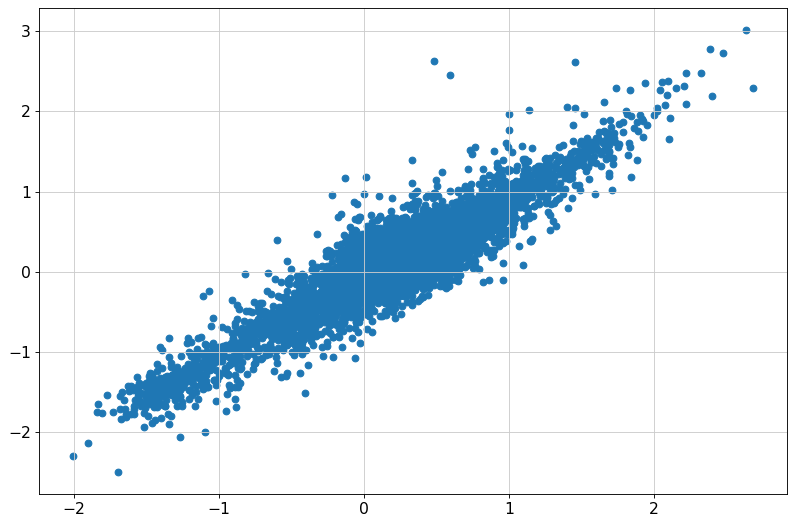

In [393]:
plt.scatter(res.iloc[[18]],res.iloc[[39]])
plt.show()

In [428]:
a=res.iloc[['18']].iloc[0]-res.iloc[['34']].iloc[0]
a.sort_values()

Gzmm             -1.267612
Dapl1            -1.191313
Klra1            -1.037587
Dleu7            -0.955377
Tpbgl            -0.916108
                    ...   
Adgrg1            0.879763
Gldc              0.897703
Slc29a4           1.064379
Glp1r             1.066126
Trav15-2-dv6-2    1.173064
Length: 5623, dtype: object